# DATA

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#!/bin/bash
!kaggle datasets download phylake1337/fire-dataset

Dataset URL: https://www.kaggle.com/datasets/phylake1337/fire-dataset
License(s): CC0-1.0
100% 386M/387M [00:20<00:00, 21.6MB/s]
100% 387M/387M [00:20<00:00, 20.2MB/s]


In [ ]:
!unzip /content/fire-dataset.zip

Archive:  /content/fire-dataset.zip
  inflating: fire_dataset/fire_images/fire.1.png  
  inflating: fire_dataset/fire_images/fire.10.png  
  inflating: fire_dataset/fire_images/fire.100.png  
  inflating: fire_dataset/fire_images/fire.101.png  
  inflating: fire_dataset/fire_images/fire.102.png  
  inflating: fire_dataset/fire_images/fire.103.png  
  inflating: fire_dataset/fire_images/fire.104.png  
  inflating: fire_dataset/fire_images/fire.105.png  
  inflating: fire_dataset/fire_images/fire.106.png  
  inflating: fire_dataset/fire_images/fire.107.png  
  inflating: fire_dataset/fire_images/fire.108.png  
  inflating: fire_dataset/fire_images/fire.109.png  
  inflating: fire_dataset/fire_images/fire.11.png  
  inflating: fire_dataset/fire_images/fire.110.png  
  inflating: fire_dataset/fire_images/fire.111.png  
  inflating: fire_dataset/fire_images/fire.112.png  
  inflating: fire_dataset/fire_images/fire.113.png  
  inflating: fire_dataset/fire_images/fire.114.png  
  inflating: f

# clean data

In [ ]:
import tensorflow as tf
%matplotlib inline
import os
import cv2

In [ ]:
image_path = os.path.join('data','fire_images','fire.1.png')
cv2.imread(image_path)

In [ ]:
import imghdr

In [ ]:
data_dir = '/content/fire_dataset'
image_exts = ['jpeg','jpg', 'bmp', 'png']
for image_class in os.listdir(data_dir):
    for image in os.listdir(os.path.join(data_dir, image_class)):
        image_path = os.path.join(data_dir, image_class, image)
        try:
            img = cv2.imread(image_path)
            tip = imghdr.what(image_path)
            if tip not in image_exts:
                print('Image not in ext list {}'.format(image_path))
                os.remove(image_path)
        except Exception as e:
            print('Issue with image {}'.format(image_path))
            # os.remove(image_path)

# ckeck data


In [ ]:
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
data = tf.keras.utils.image_dataset_from_directory('/content/fire_dataset')

Found 977 files belonging to 2 classes.


In [ ]:
data_iterator = data.as_numpy_iterator()
batch = data_iterator.next()

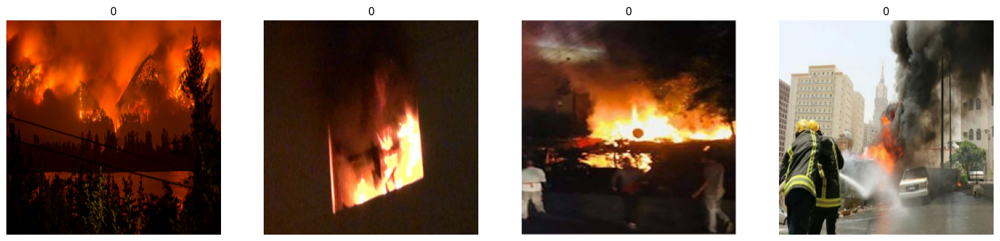

In [ ]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(ncols=4, figsize=(20, 20))
for idx, img in enumerate(batch[0][:4]):
    ax[idx].imshow(img.astype(int))
    ax[idx].title.set_text(batch[1][idx])
    ax[idx].axis('off')
plt.show()

In [ ]:
data = data.map(lambda x,y: (x/255, y))

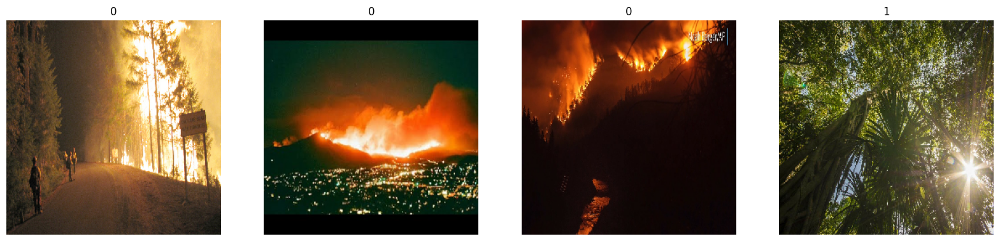

In [ ]:
batch = data.as_numpy_iterator().next()
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx, img in enumerate(batch[0][:4]):
    ax[idx].imshow(img)
    ax[idx].title.set_text(batch[1][idx])
    ax[idx].axis('off')

In [ ]:
print('Total number of batches: {}'.format(len(data)))

Total number of batches: 31


# แยก train test val

In [ ]:
train_size = int(len(data)*.7) + 1
val_size = int(len(data)*.2)
test_size = int(len(data)*.1)

In [ ]:
print('train set: {} batches'.format(train_size))
print('val set: {} batches'.format(val_size))
print('test set: {} batches'.format(test_size))

train set: 22 batches
val set: 6 batches
test set: 3 batches


In [ ]:
train = data.take(train_size)
val = data.skip(train_size).take(val_size)
test = data.skip(train_size+val_size).take(test_size)

# เทรนโมเดล

In [ ]:
train

<_TakeDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout

In [ ]:
model = Sequential()

In [ ]:
model.add(Conv2D(16, (3,3), 1, activation='relu', input_shape=(256,256,3)))
model.add(MaxPooling2D())
model.add(Conv2D(32, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())
model.add(Conv2D(16, (3,3), 1, activation='relu'))
model.add(MaxPooling2D())
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.compile('adam', loss=tf.losses.BinaryCrossentropy(), metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 254, 254, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 127, 127, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 125, 125, 32)        │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 62, 62, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 60, 60, 16)          │           4,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 30, 30, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 14400)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │       3,686,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,696,625 (14.10 MB)

 Trainable params: 3,696,625 (14.10 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
logdir='train_logs'

In [ ]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

In [ ]:
hist = model.fit(train, epochs=15, validation_data=val, callbacks=[tensorboard_callback])

Epoch 1/15
22/22 ━━━━━━━━━━━━━━━━━━━━ 36s 1s/step - accuracy: 0.7843 - loss: 0.8216 - val_accuracy: 0.9375 - val_loss: 0.1847
Epoch 2/15
22/22 ━━━━━━━━━━━━━━━━━━━━ 21s 997ms/step - accuracy: 0.9463 - loss: 0.1572 - val_accuracy: 0.9479 - val_loss: 0.1495
Epoch 3/15
22/22 ━━━━━━━━━━━━━━━━━━━━ 20s 946ms/step - accuracy: 0.9486 - loss: 0.1141 - val_accuracy: 0.9219 - val_loss: 0.1992
Epoch 4/15
22/22 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.9652 - loss: 0.0892 - val_accuracy: 0.8490 - val_loss: 0.3082
Epoch 5/15
22/22 ━━━━━━━━━━━━━━━━━━━━ 20s 914ms/step - accuracy: 0.9439 - loss: 0.1702 - val_accuracy: 0.9115 - val_loss: 0.2134
Epoch 6/15
22/22 ━━━━━━━━━━━━━━━━━━━━ 20s 921ms/step - accuracy: 0.9627 - loss: 0.1096 - val_accuracy: 0.9427 - val_loss: 0.1366
Epoch 7/15
22/22 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step - accuracy: 0.9816 - loss: 0.0556 - val_accuracy: 0.9635 - val_loss: 0.0987
Epoch 8/15
22/22 ━━━━━━━━━━━━━━━━━━━━ 21s 971ms/step - accuracy: 0.9764 - loss: 0.0558 - val_accuracy: 0.9

# ประเมินผล

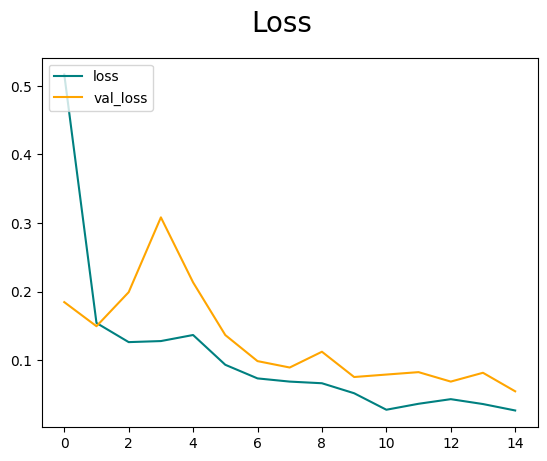

In [ ]:
fig = plt.figure()
plt.plot(hist.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.show()

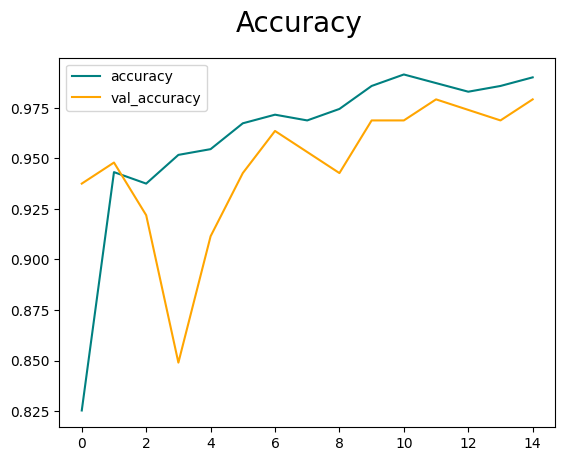

In [ ]:
fig = plt.figure()
plt.plot(hist.history['accuracy'], color='teal', label='accuracy')
plt.plot(hist.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.show()

# ทดสอบโมเดล

In [ ]:
from tensorflow.keras.metrics import Precision, Recall, BinaryAccuracy

In [ ]:
pre = Precision()
re = Recall()
acc = BinaryAccuracy()

In [ ]:
for batch in test.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)
    pre.update_state(y, yhat)
    re.update_state(y, yhat)
    acc.update_state(y, yhat)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 414ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 742ms/step


In [ ]:
print('precision: {}'.format(pre.result()))
print('recall: {}'.format(re.result()))
print('accuracy: {}'.format(acc.result()))

precision: 1.0
recall: 1.0
accuracy: 1.0


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 593ms/step


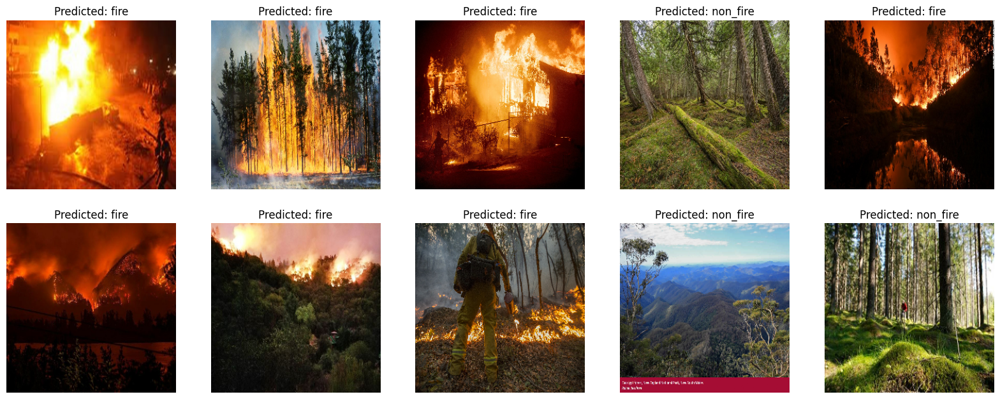

In [ ]:
for images, labels in test.take(1):
    test_images = images[:10]
    test_labels = labels[:10]

predictions = model.predict(test_images)

def get_label_name(pred):
    return 'fire' if pred < 0.5 else 'non_fire'

plt.figure(figsize=(20, 20))
for i in range(10):
    plt.subplot(5, 5, i + 1)
    plt.imshow(test_images[i])
    plt.title(f"Predicted: {get_label_name(predictions[i])}")
    plt.axis('off')
plt.show()

save model

In [ ]:
model.save('sequential_model.h5')

# ลองใช้งาน

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np

# โหลดภาพจากไฟล์ (ปรับขนาดเป็น 256x256 ตามที่โมเดลคาดหวัง)
img_path = '/content/fire_dataset/non_fire_images/non_fire.1.png'
img = image.load_img(img_path, target_size=(256, 256))  # ปรับขนาดตามที่โมเดลต้องการ

# แปลงภาพเป็น numpy array
img_array = image.img_to_array(img)

# ทำ normalization (ค่าพิกเซลในช่วง [0, 1])
img_array = img_array / 255.0

# เพิ่มมิติ batch (เนื่องจากโมเดลคาดหวังข้อมูลเป็น batch)
img_array = np.expand_dims(img_array, axis=0)  # shape จะเป็น (1, 256, 256, 3)

# ทำนายผลลัพธ์จากโมเดล
predictions = model_sequential.predict(img_array)

# ฟังก์ชันแปลงผลทำนายเป็นชื่อคลาส
def get_label_name(pred):
    return 'fire' if pred < 0.5 else 'non_fire'

# แปลงผลทำนาย
label = get_label_name(predictions[0])

# แสดงผลทำนาย
print(f"Prediction: {label}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
Prediction: non_fire


# use YOLO

In [ ]:
# ติดตั้ง Ultralytics สำหรับ YOLOv8
!pip install ultralytics
!pip install opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 887.0/887.0 kB 36.2 MB/s eta 0:00:00


In [ ]:
from google.colab import userdata
import os

os.environ["KAGGLE_KEY"] = userdata.get('KAGGLE_KEY')
os.environ["KAGGLE_USERNAME"] = userdata.get('KAGGLE_USERNAME')

In [ ]:
!kaggle kernels output zoethanayot/yolov8x -p /path/to/dest

Output file downloaded to /path/to/dest/runs/detect/train/F1_curve.png
Output file downloaded to /path/to/dest/runs/detect/train/PR_curve.png
Output file downloaded to /path/to/dest/runs/detect/train/P_curve.png
Output file downloaded to /path/to/dest/runs/detect/train/R_curve.png
Output file downloaded to /path/to/dest/runs/detect/train/args.yaml
Output file downloaded to /path/to/dest/runs/detect/train/confusion_matrix.png
Output file downloaded to /path/to/dest/runs/detect/train/confusion_matrix_normalized.png
Output file downloaded to /path/to/dest/runs/detect/train/events.out.tfevents.1731598499.11cb2a7109d3.23.0
Output file downloaded to /path/to/dest/runs/detect/train/labels.jpg
Output file downloaded to /path/to/dest/runs/detect/train/labels_correlogram.jpg
Output file downloaded to /path/to/dest/runs/detect/train/results.csv
Output file downloaded to /path/to/dest/runs/detect/train/results.png
Output file downloaded to /path/to/dest/runs/detect/train/train_batch0.jpg
Output fi

In [ ]:
dfrom ultralytics import YOLO

# โหลดโมเดล YOLOv8x a
model = YOLO('/path/to/dest/runs/detect/train/weights/best.pt')  # แทนที่ด้วยเส้นทางไฟล์โมเดลของคุณ

In [ ]:
results = model.predict(source='/SCR-25671116-mvqz.png', conf=0.25)


image 1/1 /SCR-25671116-mvqz.png: 288x640 1 severe, 2085.3ms
Speed: 19.7ms preprocess, 2085.3ms inference, 1.1ms postprocess per image at shape (1, 3, 288, 640)


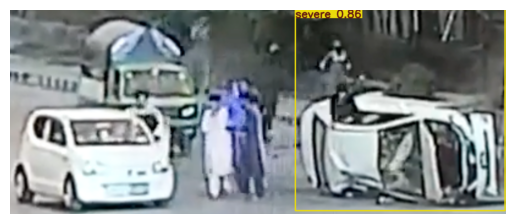

In [ ]:
from matplotlib import pyplot as plt

# แสดงผลภาพผลลัพธ์
plt.imshow(results[0].plot())
plt.axis('off')  # ปิดการแสดงแกน
plt.show()


0: 352x640 (no detections), 2564.4ms
Speed: 3.8ms preprocess, 2564.4ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)


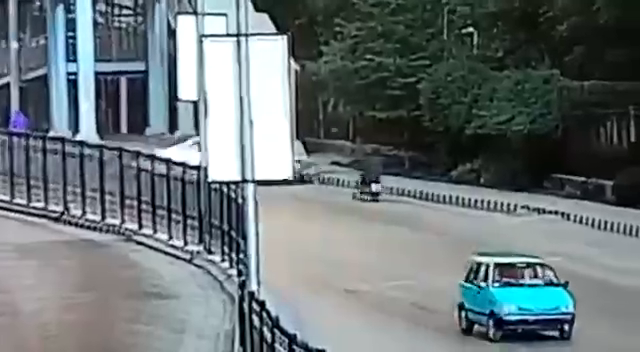

Processing frame 1 / 362
0: 352x640 (no detections), 2602.0ms
Speed: 2.1ms preprocess, 2602.0ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 2 / 362
0: 352x640 (no detections), 2925.3ms
Speed: 2.2ms preprocess, 2925.3ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 3 / 362
0: 352x640 (no detections), 3466.1ms
Speed: 1.8ms preprocess, 3466.1ms inference, 0.5ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 4 / 362
0: 352x640 (no detections), 2534.7ms
Speed: 2.0ms preprocess, 2534.7ms inference, 0.7ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 5 / 362
0: 352x640 (no detections), 2574.0ms
Speed: 3.6ms preprocess, 2574.0ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 6 / 362
0: 352x640 (no detections), 2541.7ms
Speed: 1.9ms preprocess, 2541.7ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 7 / 362
0: 352x64

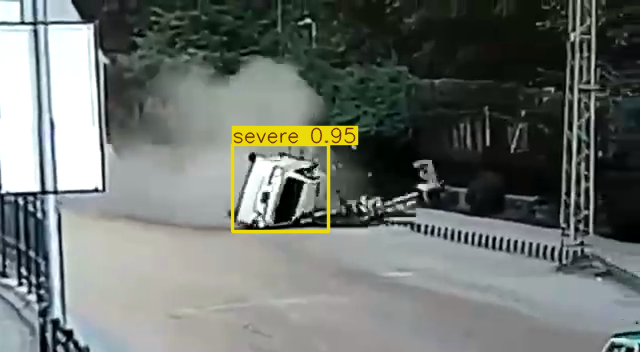

Processing frame 31 / 362
0: 352x640 1 severe, 2551.5ms
Speed: 2.3ms preprocess, 2551.5ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 32 / 362
0: 352x640 1 severe, 2564.1ms
Speed: 2.0ms preprocess, 2564.1ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 33 / 362
0: 352x640 1 severe, 2602.5ms
Speed: 1.9ms preprocess, 2602.5ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 34 / 362
0: 352x640 1 severe, 2947.8ms
Speed: 1.9ms preprocess, 2947.8ms inference, 1.4ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 35 / 362
0: 352x640 1 severe, 3372.5ms
Speed: 1.9ms preprocess, 3372.5ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 36 / 362
0: 352x640 1 severe, 2581.5ms
Speed: 1.9ms preprocess, 2581.5ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 37 / 362
0: 352x640 1 severe, 2562.1ms
Speed: 1.9ms p

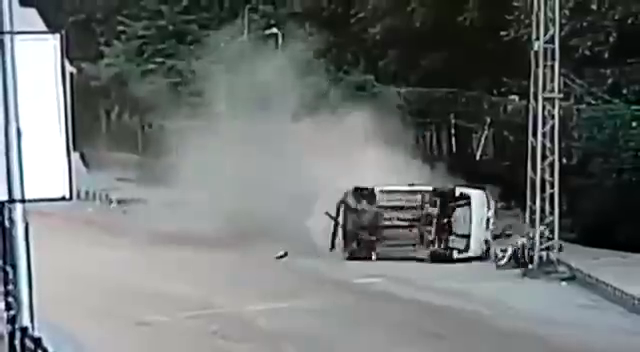

Processing frame 61 / 362
0: 352x640 (no detections), 2550.9ms
Speed: 2.0ms preprocess, 2550.9ms inference, 0.7ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 62 / 362
0: 352x640 (no detections), 3075.6ms
Speed: 1.9ms preprocess, 3075.6ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 63 / 362
0: 352x640 1 severe, 3302.6ms
Speed: 1.9ms preprocess, 3302.6ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 64 / 362
0: 352x640 1 severe, 2532.3ms
Speed: 1.8ms preprocess, 2532.3ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 65 / 362
0: 352x640 1 severe, 2564.8ms
Speed: 1.9ms preprocess, 2564.8ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 66 / 362
0: 352x640 1 severe, 2501.0ms
Speed: 1.9ms preprocess, 2501.0ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 67 / 362
0: 352x640 1 severe, 3616.6ms


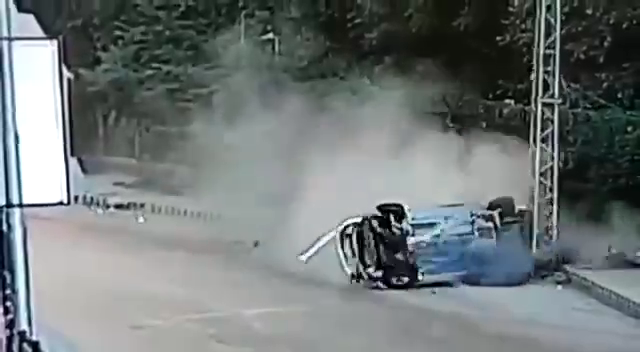

Processing frame 91 / 362
0: 352x640 (no detections), 3409.7ms
Speed: 2.2ms preprocess, 3409.7ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 92 / 362
0: 352x640 (no detections), 2545.6ms
Speed: 2.1ms preprocess, 2545.6ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 93 / 362
0: 352x640 (no detections), 2579.4ms
Speed: 2.0ms preprocess, 2579.4ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 94 / 362
0: 352x640 (no detections), 2536.3ms
Speed: 1.9ms preprocess, 2536.3ms inference, 0.7ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 95 / 362
0: 352x640 (no detections), 3375.4ms
Speed: 1.9ms preprocess, 3375.4ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 96 / 362
0: 352x640 (no detections), 2951.2ms
Speed: 3.1ms preprocess, 2951.2ms inference, 0.7ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 97 / 362
0:

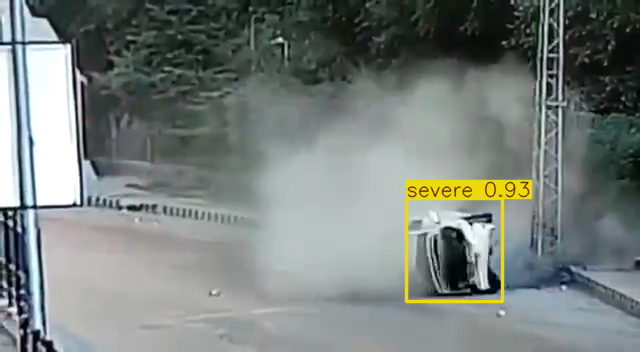

Processing frame 121 / 362
0: 352x640 1 severe, 2648.1ms
Speed: 2.2ms preprocess, 2648.1ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 122 / 362
0: 352x640 1 severe, 2594.9ms
Speed: 1.9ms preprocess, 2594.9ms inference, 1.3ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 123 / 362
0: 352x640 1 severe, 3567.0ms
Speed: 2.1ms preprocess, 3567.0ms inference, 1.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 124 / 362
0: 352x640 1 severe, 2858.5ms
Speed: 2.0ms preprocess, 2858.5ms inference, 1.4ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 125 / 362
0: 352x640 1 severe, 2547.6ms
Speed: 1.9ms preprocess, 2547.6ms inference, 1.3ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 126 / 362
0: 352x640 1 severe, 2582.6ms
Speed: 2.0ms preprocess, 2582.6ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 127 / 362
0: 352x640 1 severe, 2530.3ms
Speed: 

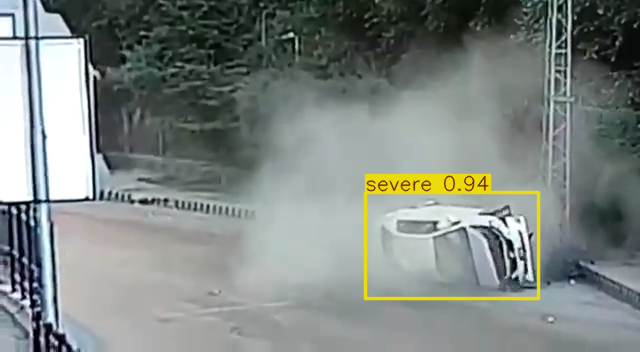

Processing frame 151 / 362
0: 352x640 1 severe, 3682.0ms
Speed: 2.1ms preprocess, 3682.0ms inference, 1.5ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 152 / 362
0: 352x640 1 severe, 2701.5ms
Speed: 1.9ms preprocess, 2701.5ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 153 / 362
0: 352x640 1 severe, 2544.6ms
Speed: 1.9ms preprocess, 2544.6ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 154 / 362
0: 352x640 1 severe, 2574.4ms
Speed: 1.9ms preprocess, 2574.4ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 155 / 362
0: 352x640 1 severe, 2658.4ms
Speed: 2.0ms preprocess, 2658.4ms inference, 1.6ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 156 / 362
0: 352x640 1 severe, 3786.4ms
Speed: 2.4ms preprocess, 3786.4ms inference, 1.6ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 157 / 362
0: 352x640 1 severe, 2630.4ms
Speed: 

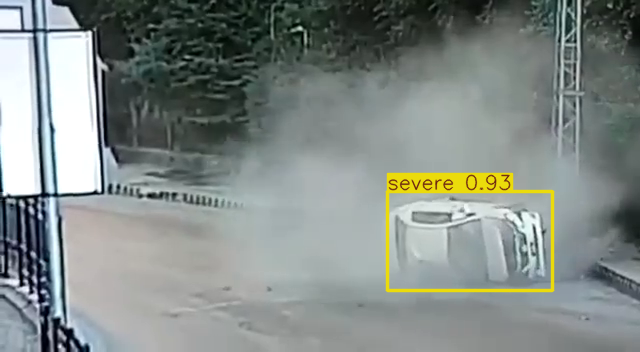

Processing frame 181 / 362
0: 352x640 1 severe, 2634.5ms
Speed: 2.0ms preprocess, 2634.5ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 182 / 362
0: 352x640 1 severe, 2513.5ms
Speed: 1.9ms preprocess, 2513.5ms inference, 1.1ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 183 / 362
0: 352x640 1 severe, 2947.3ms
Speed: 1.9ms preprocess, 2947.3ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 184 / 362
0: 352x640 1 severe, 3470.3ms
Speed: 2.3ms preprocess, 3470.3ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 185 / 362
0: 352x640 1 severe, 2518.7ms
Speed: 2.4ms preprocess, 2518.7ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 186 / 362
0: 352x640 1 severe, 2550.0ms
Speed: 2.0ms preprocess, 2550.0ms inference, 1.6ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 187 / 362
0: 352x640 1 severe, 2608.2ms
Speed: 

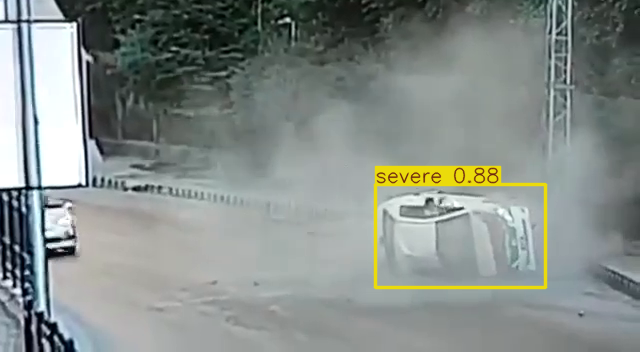

Processing frame 211 / 362
0: 352x640 1 severe, 3094.4ms
Speed: 1.8ms preprocess, 3094.4ms inference, 1.4ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 212 / 362
0: 352x640 1 severe, 3273.2ms
Speed: 3.1ms preprocess, 3273.2ms inference, 1.1ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 213 / 362
0: 352x640 1 severe, 2594.4ms
Speed: 2.0ms preprocess, 2594.4ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 214 / 362
0: 352x640 1 severe, 2548.8ms
Speed: 1.9ms preprocess, 2548.8ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 215 / 362
0: 352x640 1 severe, 2572.7ms
Speed: 2.2ms preprocess, 2572.7ms inference, 1.1ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 216 / 362
0: 352x640 1 severe, 3711.5ms
Speed: 1.9ms preprocess, 3711.5ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 217 / 362
0: 352x640 1 severe, 2675.6ms
Speed: 

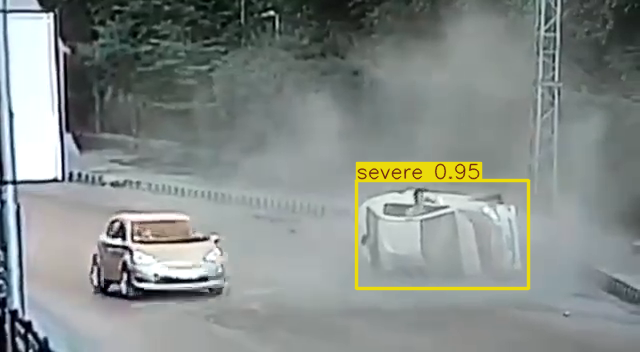

Processing frame 241 / 362
0: 352x640 1 severe, 2590.7ms
Speed: 3.8ms preprocess, 2590.7ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 242 / 362
0: 352x640 1 severe, 2607.9ms
Speed: 1.9ms preprocess, 2607.9ms inference, 1.3ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 243 / 362
0: 352x640 1 severe, 2580.1ms
Speed: 1.9ms preprocess, 2580.1ms inference, 1.1ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 244 / 362
0: 352x640 1 severe, 3833.9ms
Speed: 1.9ms preprocess, 3833.9ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 245 / 362
0: 352x640 1 severe, 2624.9ms
Speed: 2.0ms preprocess, 2624.9ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 246 / 362
0: 352x640 1 severe, 2564.9ms
Speed: 3.1ms preprocess, 2564.9ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 247 / 362
0: 352x640 1 severe, 2635.0ms
Speed: 

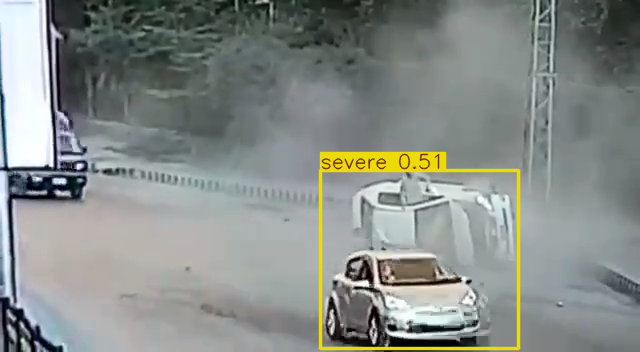

Processing frame 271 / 362
0: 352x640 1 severe, 2755.6ms
Speed: 1.9ms preprocess, 2755.6ms inference, 1.6ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 272 / 362
0: 352x640 1 severe, 3648.8ms
Speed: 2.6ms preprocess, 3648.8ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 273 / 362
0: 352x640 1 severe, 2555.9ms
Speed: 1.9ms preprocess, 2555.9ms inference, 1.1ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 274 / 362
0: 352x640 1 severe, 2594.0ms
Speed: 2.6ms preprocess, 2594.0ms inference, 1.6ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 275 / 362
0: 352x640 1 severe, 2602.3ms
Speed: 2.0ms preprocess, 2602.3ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 276 / 362
0: 352x640 (no detections), 3273.3ms
Speed: 2.0ms preprocess, 3273.3ms inference, 0.6ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 277 / 362
0: 352x640 1 severe, 3097.6ms


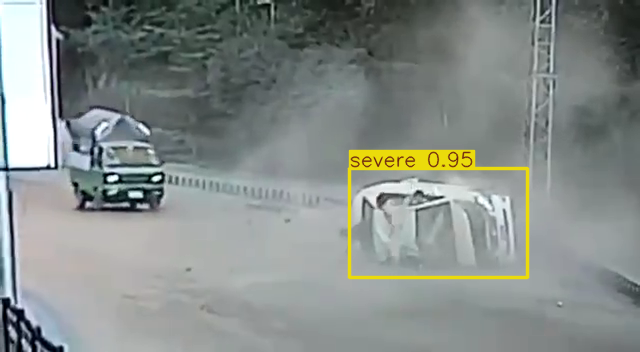

Processing frame 301 / 362
0: 352x640 1 severe, 2606.5ms
Speed: 3.3ms preprocess, 2606.5ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 302 / 362
0: 352x640 1 severe, 2561.7ms
Speed: 3.6ms preprocess, 2561.7ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 303 / 362
0: 352x640 1 severe, 3720.8ms
Speed: 1.9ms preprocess, 3720.8ms inference, 2.1ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 304 / 362
0: 352x640 1 severe, 2680.5ms
Speed: 1.9ms preprocess, 2680.5ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 305 / 362
0: 352x640 1 severe, 2589.7ms
Speed: 1.8ms preprocess, 2589.7ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 306 / 362
0: 352x640 1 severe, 2603.2ms
Speed: 1.9ms preprocess, 2603.2ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 307 / 362
0: 352x640 1 severe, 2716.2ms
Speed: 

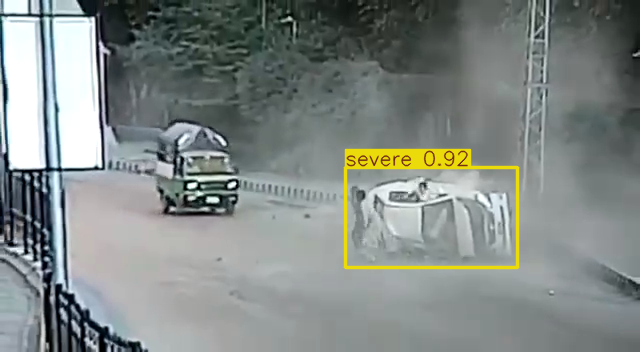

Processing frame 331 / 362
0: 352x640 1 severe, 3331.5ms
Speed: 2.0ms preprocess, 3331.5ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 332 / 362
0: 352x640 1 severe, 2633.0ms
Speed: 2.5ms preprocess, 2633.0ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 333 / 362
0: 352x640 1 severe, 2596.5ms
Speed: 1.9ms preprocess, 2596.5ms inference, 1.1ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 334 / 362
0: 352x640 1 severe, 2615.5ms
Speed: 1.9ms preprocess, 2615.5ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 335 / 362
0: 352x640 1 severe, 3841.3ms
Speed: 2.3ms preprocess, 3841.3ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 336 / 362
0: 352x640 1 severe, 2649.4ms
Speed: 2.5ms preprocess, 2649.4ms inference, 1.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 337 / 362
0: 352x640 1 severe, 2654.8ms
Speed: 

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from ultralytics import YOLO

# ระบุเส้นทางวิดีโอ
video_path = '/video_535044006808125585-Jm26XpoD.mov'  # เปลี่ยนเป็นชื่อไฟล์วิดีโอที่อัปโหลด

# เปิดวิดีโอ
cap = cv2.VideoCapture(video_path)

# ตั้งค่า video writer เพื่อบันทึกวิดีโอผลลัพธ์
output_path = '/content/output_video.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

frame_count = 0
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # ใช้โมเดลตรวจจับวัตถุในเฟรม
    results = model(frame, imgsz=640)  # imgsz คือขนาดภาพที่ใช้ประมวลผล

    # วาดผลลัพธ์บนเฟรม
    annotated_frame = results[0].plot()

    # แสดงเฟรม (แสดงทุกๆ 30 เฟรมเพื่อไม่ให้ Colab ช้าเกินไป)
    if frame_count % 30 == 0:
        cv2_imshow(cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB))

    # บันทึกเฟรมลงไฟล์
    out.write(annotated_frame)

    frame_count += 1
    print(f'Processing frame {frame_count} / {total_frames}', end='\r')

# ปล่อยทรัพยากร
cap.release()
out.release()
cv2.destroyAllWindows()

print("\nการประมวลผลเสร็จสมบูรณ์แล้ว!")


In [ ]:
# ดาวน์โหลดวิดีโอผลลัพธ์
from google.colab import files
files.download(output_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# use yolov8x + cnn model


ลอง


image 1/1 /car-crash.jpg: 320x640 1 severe, 60.7ms
Speed: 2.2ms preprocess, 60.7ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 640)


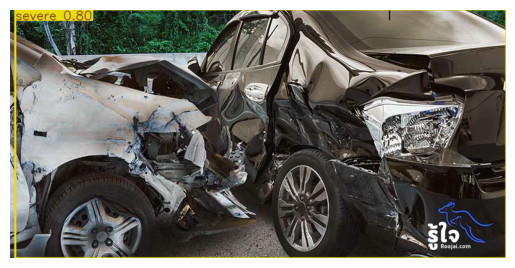

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
Prediction: non_fire


In [ ]:
from ultralytics import YOLO
img_path = '/car-crash.jpg'
# โหลดโมเดล YOLOv8x ที่คุณมี
model = YOLO('/path/to/dest/runs/detect/train/weights/best.pt')  # แทนที่ด้วยเส้นทางไฟล์โมเดลของคุณ
results = model.predict(source=img_path, conf=0.25)
from matplotlib import pyplot as plt
# แสดงผลภาพผลลัพธ์
plt.imshow(results[0].plot())
plt.axis('off')  # ปิดการแสดงแกน
plt.show()

import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
model_sequential = tf.keras.models.load_model('/content/drive/MyDrive/sequential_model.h5')  # ระบุ path ให้ตรง
# โหลดภาพจากไฟล์ (ปรับขนาดเป็น 256x256 ตามที่โมเดลคาดหวัง)
img = image.load_img(img_path, target_size=(256, 256))  # ปรับขนาดตามที่โมเดลต้องการ
# แปลงภาพเป็น numpy array
img_array = image.img_to_array(img)
# ทำ normalization (ค่าพิกเซลในช่วง [0, 1])
img_array = img_array / 255.0
# เพิ่มมิติ batch (เนื่องจากโมเดลคาดหวังข้อมูลเป็น batch)
img_array = np.expand_dims(img_array, axis=0)  # shape จะเป็น (1, 256, 256, 3)
# ทำนายผลลัพธ์จากโมเดล
predictions = model_sequential.predict(img_array)
# ฟังก์ชันแปลงผลทำนายเป็นชื่อคลาส
def get_label_name(pred):
    return 'fire' if pred < 0.5 else 'non_fire'
# แปลงผลทำนาย
label = get_label_name(predictions[0])
# แสดงผลทำนาย
print(f"Prediction: {label}")

สมบูรณ์


0: 352x640 (no detections), 63.6ms
Speed: 1.5ms preprocess, 63.6ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)


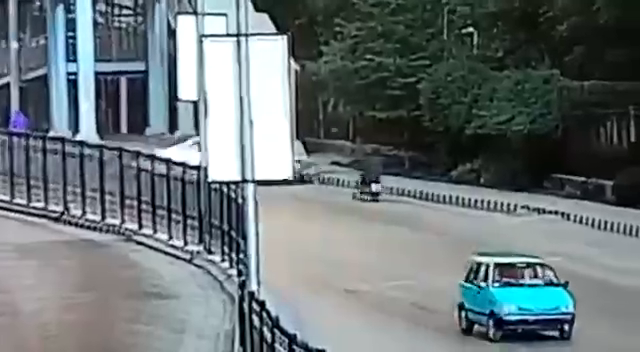

Processing frame 1 / 362
0: 352x640 (no detections), 36.8ms
Speed: 3.6ms preprocess, 36.8ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 2 / 362
0: 352x640 (no detections), 36.7ms
Speed: 1.4ms preprocess, 36.7ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 3 / 362
0: 352x640 (no detections), 37.1ms
Speed: 1.4ms preprocess, 37.1ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 4 / 362
0: 352x640 (no detections), 36.7ms
Speed: 1.4ms preprocess, 36.7ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 5 / 362
0: 352x640 (no detections), 36.7ms
Speed: 1.3ms preprocess, 36.7ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 6 / 362
0: 352x640 (no detections), 37.0ms
Speed: 1.3ms preprocess, 37.0ms inference, 1.7ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 7 / 362
0: 352x640 (no detections), 35.9m

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step
Frame 19: Prediction: fire
Fire detected! Stopping CNN classification.
Processing frame 25 / 362
0: 352x640 1 severe, 32.4ms
Speed: 1.6ms preprocess, 32.4ms inference, 1.6ms postprocess per image at shape (1, 3, 352, 640)


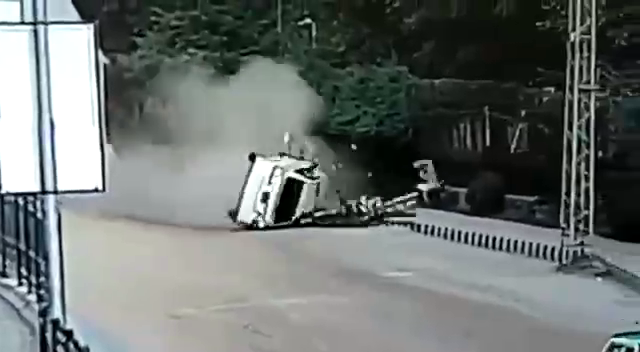

Processing frame 31 / 362
0: 352x640 1 severe, 31.7ms
Speed: 1.5ms preprocess, 31.7ms inference, 2.1ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 37 / 362
0: 352x640 1 severe, 31.2ms
Speed: 1.4ms preprocess, 31.2ms inference, 2.1ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 43 / 362
0: 352x640 1 severe, 31.9ms
Speed: 1.5ms preprocess, 31.9ms inference, 1.8ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 49 / 362
0: 352x640 2 severes, 29.6ms
Speed: 2.2ms preprocess, 29.6ms inference, 1.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 55 / 362
0: 352x640 1 severe, 31.4ms
Speed: 2.2ms preprocess, 31.4ms inference, 1.9ms postprocess per image at shape (1, 3, 352, 640)


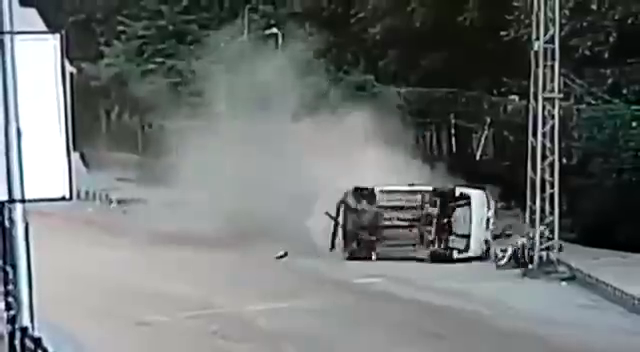

Processing frame 61 / 362
0: 352x640 (no detections), 37.5ms
Speed: 1.9ms preprocess, 37.5ms inference, 0.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 62 / 362
0: 352x640 (no detections), 35.1ms
Speed: 1.5ms preprocess, 35.1ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)

0: 352x640 1 severe, 35.5ms
Speed: 2.3ms preprocess, 35.5ms inference, 1.7ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 69 / 362
0: 352x640 1 severe, 31.7ms
Speed: 1.6ms preprocess, 31.7ms inference, 2.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 75 / 362
0: 352x640 1 severe, 28.7ms
Speed: 1.5ms preprocess, 28.7ms inference, 5.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 81 / 362
0: 352x640 1 severe, 29.7ms
Speed: 1.5ms preprocess, 29.7ms inference, 1.6ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 87 / 362
0: 352x640 1 severe, 30.3ms
Speed: 1.4ms preprocess, 30.3ms inference, 1.8ms po

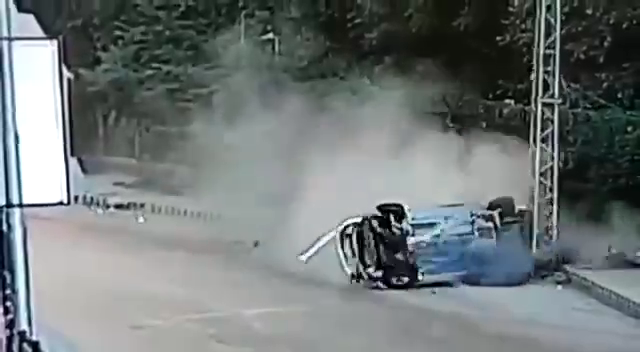

Processing frame 93 / 362
0: 352x640 (no detections), 28.6ms
Speed: 1.6ms preprocess, 28.6ms inference, 5.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 94 / 362
0: 352x640 (no detections), 34.3ms
Speed: 1.4ms preprocess, 34.3ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 95 / 362
0: 352x640 (no detections), 35.7ms
Speed: 1.4ms preprocess, 35.7ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 96 / 362
0: 352x640 (no detections), 33.2ms
Speed: 1.3ms preprocess, 33.2ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 97 / 362
0: 352x640 (no detections), 34.9ms
Speed: 1.3ms preprocess, 34.9ms inference, 1.0ms postprocess per image at shape (1, 3, 352, 640)

0: 352x640 (no detections), 34.1ms
Speed: 1.3ms preprocess, 34.1ms inference, 1.1ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 99 / 362
0: 352x640 1 severe, 34.9ms
Speed: 2.0ms preprocess

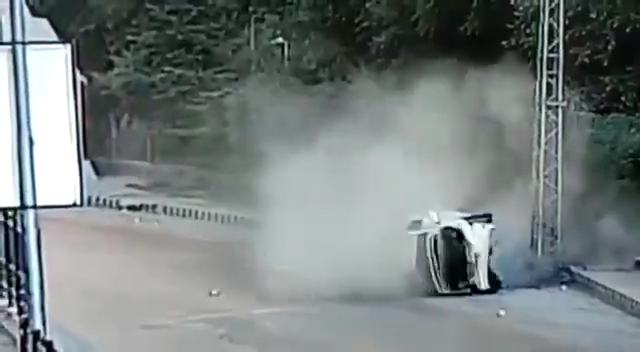

Processing frame 123 / 362
0: 352x640 1 severe, 31.3ms
Speed: 1.6ms preprocess, 31.3ms inference, 1.8ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 129 / 362
0: 352x640 1 severe, 30.8ms
Speed: 1.5ms preprocess, 30.8ms inference, 1.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 135 / 362
0: 352x640 1 severe, 30.3ms
Speed: 1.4ms preprocess, 30.3ms inference, 2.0ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 141 / 362
0: 352x640 1 severe, 30.3ms
Speed: 1.4ms preprocess, 30.3ms inference, 1.8ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 147 / 362
0: 352x640 1 severe, 31.2ms
Speed: 1.4ms preprocess, 31.2ms inference, 5.9ms postprocess per image at shape (1, 3, 352, 640)


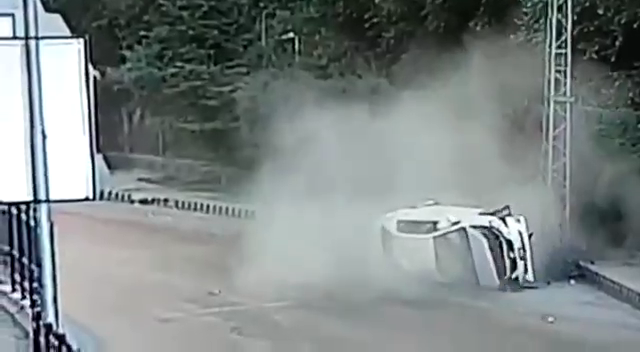

Processing frame 153 / 362
0: 352x640 1 severe, 31.2ms
Speed: 1.4ms preprocess, 31.2ms inference, 1.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 159 / 362
0: 352x640 1 severe, 30.3ms
Speed: 1.5ms preprocess, 30.3ms inference, 2.0ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 165 / 362
0: 352x640 1 severe, 34.9ms
Speed: 1.5ms preprocess, 34.9ms inference, 3.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 171 / 362
0: 352x640 1 severe, 32.7ms
Speed: 1.7ms preprocess, 32.7ms inference, 1.8ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 177 / 362
0: 352x640 1 severe, 32.8ms
Speed: 1.7ms preprocess, 32.8ms inference, 2.0ms postprocess per image at shape (1, 3, 352, 640)


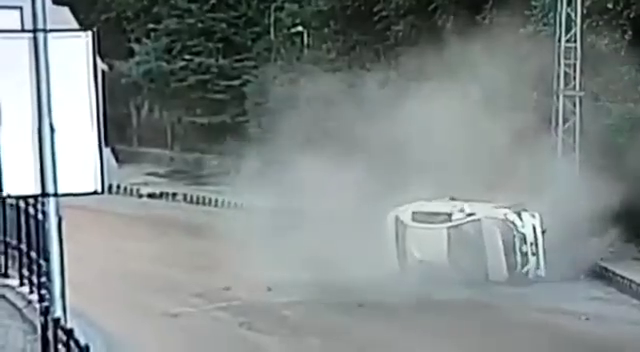

Processing frame 183 / 362
0: 352x640 1 severe, 33.1ms
Speed: 1.8ms preprocess, 33.1ms inference, 3.9ms postprocess per image at shape (1, 3, 352, 640)

0: 352x640 1 severe, 33.4ms
Speed: 1.6ms preprocess, 33.4ms inference, 1.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 195 / 362
0: 352x640 1 severe, 33.1ms
Speed: 1.4ms preprocess, 33.1ms inference, 2.1ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 201 / 362
0: 352x640 1 severe, 33.2ms
Speed: 1.6ms preprocess, 33.2ms inference, 1.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 207 / 362
0: 352x640 1 severe, 33.4ms
Speed: 1.5ms preprocess, 33.4ms inference, 2.2ms postprocess per image at shape (1, 3, 352, 640)


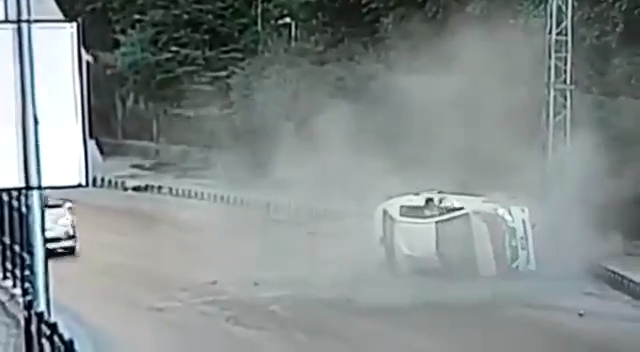

Processing frame 213 / 362
0: 352x640 1 severe, 34.1ms
Speed: 2.1ms preprocess, 34.1ms inference, 1.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 219 / 362
0: 352x640 1 severe, 34.7ms
Speed: 1.4ms preprocess, 34.7ms inference, 4.0ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 225 / 362
0: 352x640 1 severe, 33.9ms
Speed: 1.6ms preprocess, 33.9ms inference, 3.8ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 231 / 362
0: 352x640 1 severe, 33.8ms
Speed: 1.5ms preprocess, 33.8ms inference, 2.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 237 / 362
0: 352x640 1 severe, 33.7ms
Speed: 1.6ms preprocess, 33.7ms inference, 2.3ms postprocess per image at shape (1, 3, 352, 640)


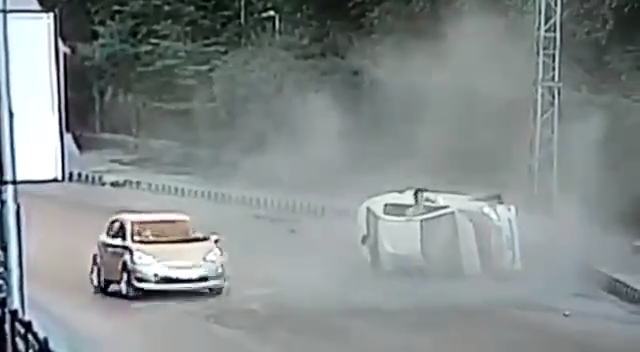

Processing frame 243 / 362
0: 352x640 1 severe, 33.7ms
Speed: 1.5ms preprocess, 33.7ms inference, 1.8ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 249 / 362
0: 352x640 1 severe, 33.7ms
Speed: 1.4ms preprocess, 33.7ms inference, 1.8ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 255 / 362
0: 352x640 1 severe, 34.2ms
Speed: 1.5ms preprocess, 34.2ms inference, 1.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 261 / 362
0: 352x640 1 severe, 36.2ms
Speed: 1.4ms preprocess, 36.2ms inference, 2.0ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 267 / 362
0: 352x640 2 severes, 30.4ms
Speed: 1.5ms preprocess, 30.4ms inference, 1.9ms postprocess per image at shape (1, 3, 352, 640)


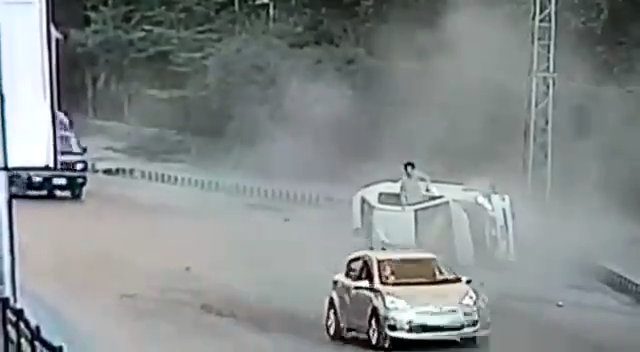

Processing frame 273 / 362
0: 352x640 1 severe, 31.1ms
Speed: 1.6ms preprocess, 31.1ms inference, 1.9ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 279 / 362
0: 352x640 1 severe, 30.1ms
Speed: 1.6ms preprocess, 30.1ms inference, 1.7ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 285 / 362
0: 352x640 1 severe, 31.1ms
Speed: 1.6ms preprocess, 31.1ms inference, 1.6ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 291 / 362
0: 352x640 1 severe, 31.0ms
Speed: 1.4ms preprocess, 31.0ms inference, 1.7ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 297 / 362
0: 352x640 1 severe, 30.9ms
Speed: 1.5ms preprocess, 30.9ms inference, 1.8ms postprocess per image at shape (1, 3, 352, 640)


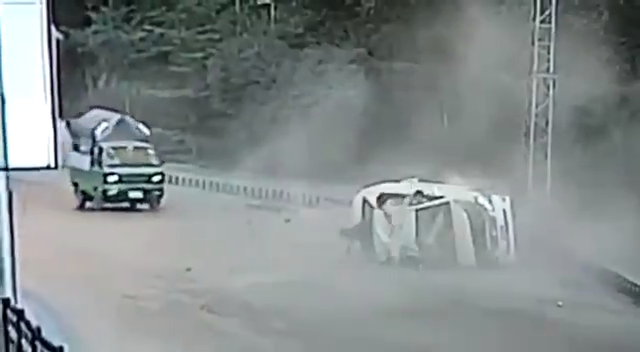

Processing frame 303 / 362
0: 352x640 1 severe, 30.9ms
Speed: 2.9ms preprocess, 30.9ms inference, 2.3ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 309 / 362
0: 352x640 1 severe, 31.1ms
Speed: 1.4ms preprocess, 31.1ms inference, 3.3ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 315 / 362
0: 352x640 1 severe, 29.9ms
Speed: 5.6ms preprocess, 29.9ms inference, 2.2ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 321 / 362
0: 352x640 1 severe, 29.8ms
Speed: 1.6ms preprocess, 29.8ms inference, 2.4ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 327 / 362
0: 352x640 1 severe, 29.8ms
Speed: 1.7ms preprocess, 29.8ms inference, 2.8ms postprocess per image at shape (1, 3, 352, 640)


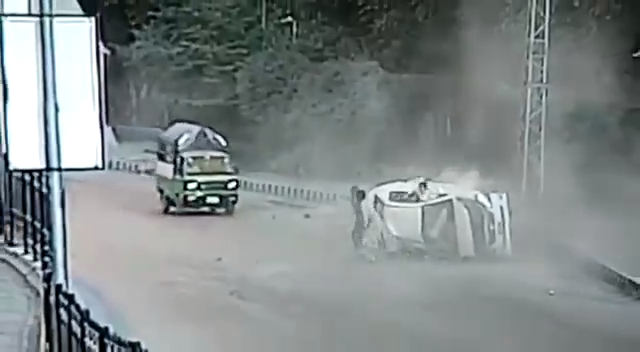

Processing frame 333 / 362
0: 352x640 1 severe, 30.4ms
Speed: 2.6ms preprocess, 30.4ms inference, 1.7ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 339 / 362
0: 352x640 1 severe, 31.4ms
Speed: 1.8ms preprocess, 31.4ms inference, 1.7ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 345 / 362
0: 352x640 1 severe, 29.6ms
Speed: 1.5ms preprocess, 29.6ms inference, 2.0ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 351 / 362
0: 352x640 1 severe, 31.1ms
Speed: 1.5ms preprocess, 31.1ms inference, 2.1ms postprocess per image at shape (1, 3, 352, 640)
Processing frame 355 / 362
การประมวลผลเสร็จสมบูรณ์แล้ว!


In [ ]:
import cv2
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np

# โหลดโมเดล YOLO
model_yolo = YOLO('/path/to/dest/runs/detect/train/weights/best.pt')  # หรือเปลี่ยนเป็นโมเดลของคุณเอง

# โหลดโมเดล CNN
model_cnn = tf.keras.models.load_model('/content/drive/MyDrive/sequential_model.h5')  # เปลี่ยนเป็นเส้นทางโมเดลของคุณ

# ระบุเส้นทางวิดีโอ
video_path = '/content/test.mov'  # เปลี่ยนเป็นชื่อไฟล์วิดีโอที่อัปโหลด

# เปิดวิดีโอ
cap = cv2.VideoCapture(video_path)

# ตรวจสอบว่าวิดีโอเปิดได้หรือไม่
if not cap.isOpened():
    print("Error: ไม่สามารถเปิดไฟล์วิดีโอได้")
    exit()

# ตั้งค่า video writer เพื่อบันทึกวิดีโอผลลัพธ์
output_path = '/content/output_video.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
out = cv2.VideoWriter(output_path, fourcc, fps, (width, height))

frame_count = 0
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

# ตัวแปรควบคุมการใช้ CNN
cnn_active = True
frame_skip = 0  # ตัวนับเฟรมที่จะข้ามหลังจากตรวจจับ

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    if frame_skip > 0:
        frame_skip -= 1
        annotated_frame = frame  # ใช้เฟรมเดิมโดยไม่แก้ไข
    else:
        # ใช้โมเดล YOLO ตรวจจับวัตถุในเฟรม
        results = model_yolo(frame, imgsz=640)  # imgsz คือขนาดภาพที่ใช้ประมวลผล

        # วาดผลลัพธ์บนเฟรม (YOLO bounding boxes และ labels)
        annotated_frame = results[0].plot()

        # ตรวจสอบว่ามีการตรวจจับวัตถุหรือไม่
        if results[0].boxes:
            for box in results[0].boxes:
                # ดึงค่าพิกัดของ bounding box
                x1, y1, x2, y2 = map(int, box.xyxy[0])

                # ครอบภาพตาม bounding box
                cropped_img = frame[y1:y2, x1:x2]

                # ตรวจสอบว่า CNN ยังใช้งานอยู่หรือไม่
                if cnn_active:
                    # เตรียมภาพสำหรับโมเดล CNN
                    img = cv2.resize(cropped_img, (256, 256))
                    img_array = img / 255.0
                    img_array = np.expand_dims(img_array, axis=0)  # shape จะเป็น (1, 256, 256, 3)

                    # ทำนายผลลัพธ์จากโมเดล CNN
                    predictions = model_cnn.predict(img_array)

                    # ฟังก์ชันแปลงผลทำนายเป็นชื่อคลาส
                    def get_label_name(pred):
                        return 'fire' if pred < 0.5 else 'non_fire'

                    # แปลงผลทำนาย
                    label = get_label_name(predictions[0])

                    # แสดงผลทำนายทางหน้าจอ
                    print(f"Frame {frame_count}: Prediction: {label}")

                    # ถ้าตรวจพบไฟ หยุดใช้ CNN
                    if label == 'fire':
                        cnn_active = False
                        print("Fire detected! Stopping CNN classification.")

            # หลังจากตรวจจับแล้ว รออีก 5 เฟรม
            frame_skip = 5
        else:
            # ถ้าไม่มีการตรวจจับวัตถุ ก็ใช้เฟรมที่วาด bounding box ของ YOLO
            pass  # ไม่ต้องทำอะไรเพิ่มเติม

    # แสดงเฟรม (แสดงทุกๆ 30 เฟรมเพื่อไม่ให้ Colab ช้าเกินไป)
    if frame_count % 30 == 0:
        cv2_imshow(cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB))

    # บันทึกเฟรมลงไฟล์
    out.write(annotated_frame)

    frame_count += 1
    print(f'Processing frame {frame_count} / {total_frames}', end='\r')

# ปล่อยทรัพยากร
cap.release()
out.release()
cv2.destroyAllWindows()

print("\nการประมวลผลเสร็จสมบูรณ์แล้ว!")
